# Player Shooting Avg

In [ ]:
import pandas as pd

In [ ]:
df = pd.read_csv('https://raw.githubusercontent.com/cse151a-nba-project/data/main/Player%20Per%20Game.csv')
df = df.drop(columns=['age', 'experience'])
display(df)

,seas_id,season,player_id,player,birth_year,pos,lg,tm,g,gs,...,ft_percent,orb_per_game,drb_per_game,trb_per_game,ast_per_game,stl_per_game,blk_per_game,tov_per_game,pf_per_game,pts_per_game
0,31136,2024,5025,A.J. Green,NaN,SG,NBA,MIL,28,0.0,...,1.000,0.2,0.6,0.8,0.6,0.0,0.0,0.0,0.9,3.3
1,31137,2024,5026,A.J. Lawson,NaN,SG,NBA,DAL,22,0.0,...,0.706,0.5,0.8,1.3,0.6,0.4,0.1,0.5,0.8,4.2
2,31138,2024,5027,AJ Griffin,NaN,SF,NBA,ATL,18,0.0,...,1.000,0.1,0.7,0.8,0.2,0.1,0.1,0.3,0.3,2.1
3,31139,2024,4219,Aaron Gordon,NaN,PF,NBA,DEN,43,43.0,...,0.614,2.6,4.1,6.7,3.1,0.8,0.7,1.3,1.9,13.6
4,31140,2024,4582,Aaron Holiday,NaN,PG,NBA,HOU,44,1.0,...,0.912,0.3,1.6,1.9,1.7,0.5,0.1,0.8,1.5,6.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31708,200,1947,157,Walt Miller,NaN,F,BAA,PIT,12,NaN,...,0.500,NaN,NaN,NaN,0.5,NaN,NaN,NaN,1.3,1.9
31709,201,1947,158,Warren Fenley,NaN,F,BAA,BOS,33,NaN,...,0.511,NaN,NaN,NaN,0.5,NaN,NaN,NaN,1.8,2.6
31710,202,1947,159,Wilbert Kautz,NaN,G-F,BAA,CHS,50,NaN,...,0.534,NaN,NaN,NaN,0.7,NaN,NaN,NaN,2.3,5.1
31711,203,1947,160,Woody Grimshaw,NaN,G,BAA,PRO,21,NaN,...,0.477,NaN,NaN,NaN,0.0,NaN,NaN,NaN,1.2,2.9


In [ ]:

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import linregress
from matplotlib.ticker import MaxNLocator
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler

from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler


imputer = SimpleImputer(strategy='median')
df['pts_per_game'] = imputer.fit_transform(df[['pts_per_game']])


scaler = StandardScaler()
df['pts_per_game_scaled'] = scaler.fit_transform(df[['pts_per_game']])

df = df[df.season > 1990]
df = df[df.season < 2024]
df = df[df.g > 40]


In [ ]:

df_sample = df.copy()

df_sample['decade'] = df_sample['season'].apply(lambda year: '1990s' if 1990 <= year <= 1999 else
                                                 '2000s' if 2000 <= year <= 2009 else
                                                 '2010s' if 2010 <= year <= 2019 else
                                                 '2020-2023' if 2020 <= year <= 2023 else 'Other')

Q1 = df_sample['pts_per_game'].quantile(0.25)
Q3 = df_sample['pts_per_game'].quantile(0.75)
IQR = Q3 - Q1
df_sample_filtered = df_sample[~((df_sample['pts_per_game'] < (Q1 - 1.5 * IQR)) | (df_sample['pts_per_game'] > (Q3 + 1.5 * IQR)))]
df_sample_filtered = df_sample_filtered[['season', 'decade', 'player', 'fga_per_game', 'fg_percent', 'x2pa_per_game', 'x2p_percent', 'x3pa_per_game', 'x3p_percent', 'e_fg_percent', 'trb_per_game', 'ast_per_game', 'stl_per_game', 'blk_per_game', 'tov_per_game', 'pts_per_game']]


In [ ]:
df_sample_filtered

,season,decade,player,fga_per_game,fg_percent,x2pa_per_game,x2p_percent,x3pa_per_game,x3p_percent,e_fg_percent,trb_per_game,ast_per_game,stl_per_game,blk_per_game,tov_per_game,pts_per_game
582,2023,2020-2023,AJ Griffin,7.4,0.465,3.8,0.536,3.6,0.390,0.560,2.1,1.0,0.6,0.2,0.6,8.9
583,2023,2020-2023,Aaron Gordon,11.2,0.564,8.6,0.628,2.5,0.347,0.603,6.6,3.0,0.8,0.8,1.4,16.3
584,2023,2020-2023,Aaron Holiday,3.5,0.418,2.1,0.424,1.4,0.409,0.500,1.2,1.4,0.6,0.2,0.6,3.9
585,2023,2020-2023,Aaron Nesmith,8.1,0.427,3.8,0.496,4.3,0.366,0.525,3.8,1.3,0.8,0.5,1.0,10.1
586,2023,2020-2023,Aaron Wiggins,5.2,0.512,3.4,0.573,1.7,0.393,0.579,3.0,1.1,0.6,0.2,0.8,6.8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19447,1991,1990s,Willie Burton,10.2,0.441,9.8,0.454,0.4,0.133,0.444,3.4,1.4,0.9,0.3,1.9,12.0
19449,1991,1990s,Winston Garland,7.5,0.426,7.1,0.440,0.4,0.154,0.430,2.9,4.6,1.4,0.1,1.7,8.2
19450,1991,1990s,Xavier McDaniel,14.6,0.497,14.5,0.501,0.1,0.000,0.497,6.9,2.3,0.9,0.6,2.3,17.0
19452,1991,1990s,Xavier McDaniel,13.6,0.503,13.5,0.506,0.1,0.000,0.503,7.2,2.3,0.8,0.6,2.2,15.8


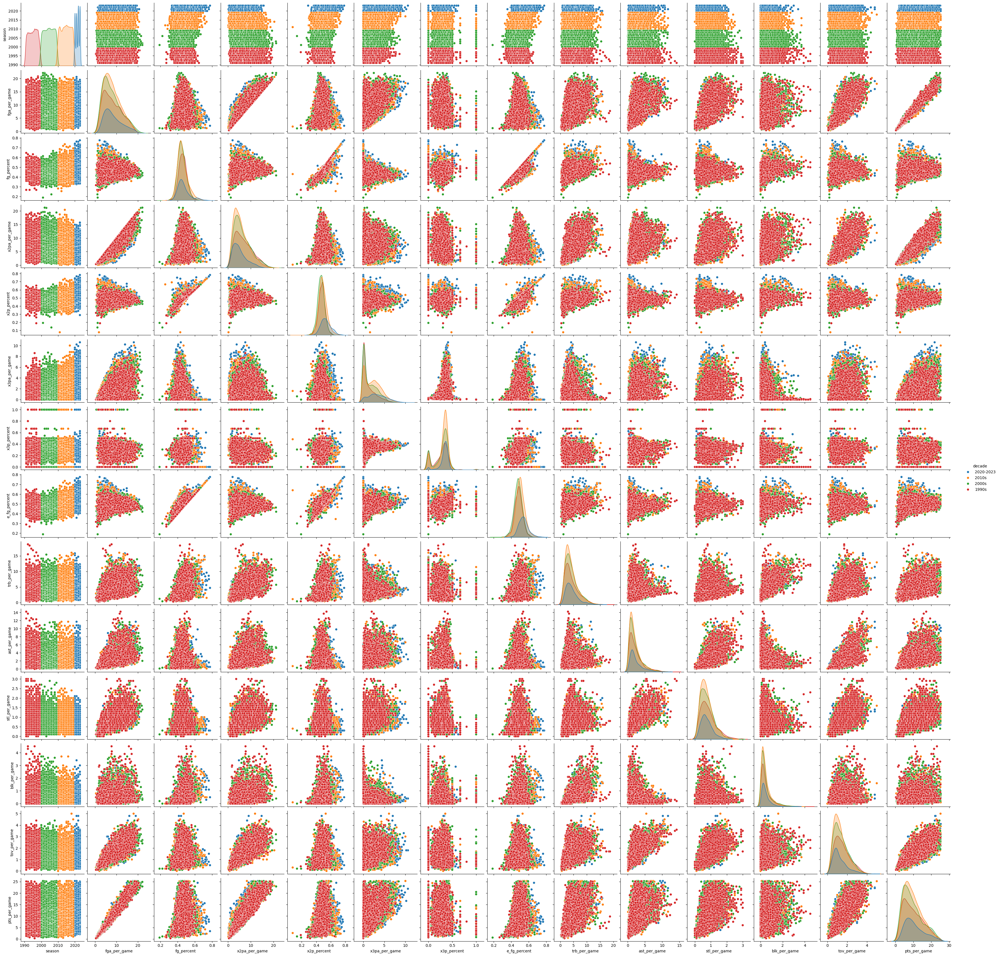

<ipython-input-48-0b1284a485af>:5: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr = df_sample_filtered.corr()


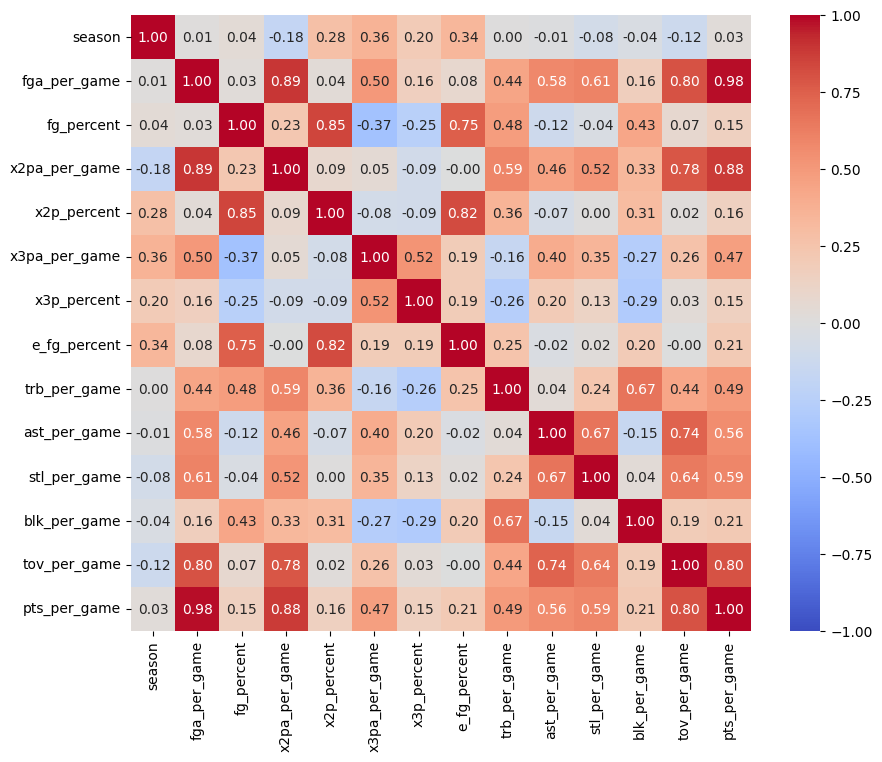

In [ ]:

sns.pairplot(df_sample_filtered, hue='decade')
plt.show()


corr = df_sample_filtered.corr()
plt.figure(figsize=(10, 8))
sns.heatmap(corr, annot=True, fmt=".2f", vmin=-1, vmax=1, center=0, cmap='coolwarm')
plt.show()


# Player Per 100 Poss

In [ ]:
#load raw data
per_100_poss = pd.read_csv("https://raw.githubusercontent.com/cse151a-nba-project/data/main/Per%20100%20Poss.csv")

In [ ]:
#filter usable columns
per100_filtered = per_100_poss.copy()[['seas_id', 'season', 'player', 'fga_per_100_poss', 'fg_percent', 'x2pa_per_100_poss', 'x2p_percent', 'x3pa_per_100_poss', 'x3p_percent', 'trb_per_100_poss', 'ast_per_100_poss', 'stl_per_100_poss', 'blk_per_100_poss', 'tov_per_100_poss', 'pts_per_100_poss']]

#filter out rows that are not within the seasons 1990 to 2023
per100_filtered = per100_filtered[per100_filtered['season'] >= 1990]
per100_filtered = per100_filtered[per100_filtered['season'] <= 2023]

per100_filtered

,seas_id,season,player,fga_per_100_poss,fg_percent,x2pa_per_100_poss,x2p_percent,x3pa_per_100_poss,x3p_percent,trb_per_100_poss,ast_per_100_poss,stl_per_100_poss,blk_per_100_poss,tov_per_100_poss,pts_per_100_poss
578,30458,2023,A.J. Green,17.3,0.424,2.8,0.450,14.5,0.419,6.2,3.0,0.8,0.0,1.2,21.3
579,30459,2023,A.J. Lawson,20.2,0.500,8.7,0.632,11.5,0.400,9.7,0.9,0.9,0.0,1.4,25.8
580,30460,2023,A.J. Lawson,23.8,1.000,23.8,1.000,0.0,NaN,23.8,0.0,0.0,0.0,0.0,47.5
581,30461,2023,A.J. Lawson,20.2,0.488,8.4,0.611,11.7,0.400,9.4,0.9,0.9,0.0,1.4,25.3
582,30467,2023,AJ Griffin,18.1,0.465,9.3,0.536,8.8,0.390,5.2,2.5,1.4,0.4,1.4,21.7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19908,12256,1990,Winston Garland,14.6,0.375,14.1,0.385,0.5,0.100,5.6,8.0,2.4,0.3,4.1,13.7
19909,12257,1990,Winston Garland,15.8,0.428,14.4,0.429,1.4,0.423,5.7,8.1,1.7,0.3,4.3,16.9
19910,12258,1990,Xavier McDaniel,25.5,0.496,25.2,0.498,0.4,0.294,9.3,3.5,1.5,0.7,3.9,30.5
19911,12177,1990,Šarūnas Marčiulionis,14.9,0.519,13.9,0.539,1.0,0.256,5.9,3.2,2.5,0.2,3.7,24.2


In [ ]:
#take a random sample of 50 rows
per100_sample = per100_filtered.copy()

#create a column called decade, that calssifies the season into one of these decades: 1990-1999, 2000-2009, 2010-2019, 2020-2023
per100_sample['decade'] = pd.cut(per100_sample['season'], bins=[1989, 1999, 2009, 2019, 2023], labels=['1990-1999', '2000-2009', '2010-2019', '2020-2023'])

#normalize all of the columns using min max normalization
normalized = per100_sample.copy()
normalized = normalized.drop(columns = ['seas_id', 'season', 'player', 'decade'])
normalized = (normalized - normalized.min()) / (normalized.max() - normalized.min())

#impute null values with the median
for column in normalized.columns:
    normalized[column] = normalized[column].fillna(normalized[column].median())

#add back the decade column
normalized['decade'] = per100_sample['decade']
normalized['player'] = per100_sample['player']
normalized['season'] = per100_sample['season']


normalized

,fga_per_100_poss,fg_percent,x2pa_per_100_poss,x2p_percent,x3pa_per_100_poss,x3p_percent,trb_per_100_poss,ast_per_100_poss,stl_per_100_poss,blk_per_100_poss,tov_per_100_poss,pts_per_100_poss,decade,player,season
578,0.264122,0.424,0.042748,0.450,0.274102,0.419,0.058435,0.061224,0.032,0.000000,0.022514,0.133292,2020-2023,A.J. Green,2023
579,0.308397,0.500,0.132824,0.632,0.217391,0.400,0.091423,0.018367,0.036,0.000000,0.026266,0.161452,2020-2023,A.J. Lawson,2023
580,0.363359,1.000,0.363359,1.000,0.000000,0.321,0.224317,0.000000,0.000,0.000000,0.000000,0.297247,2020-2023,A.J. Lawson,2023
581,0.308397,0.488,0.128244,0.611,0.221172,0.400,0.088596,0.018367,0.036,0.000000,0.026266,0.158323,2020-2023,A.J. Lawson,2023
582,0.276336,0.465,0.141985,0.536,0.166352,0.390,0.049010,0.051020,0.056,0.007353,0.026266,0.135795,2020-2023,AJ Griffin,2023
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19908,0.222901,0.375,0.215267,0.385,0.009452,0.100,0.052780,0.163265,0.096,0.005515,0.076923,0.085732,1990-1999,Winston Garland,1990
19909,0.241221,0.428,0.219847,0.429,0.026465,0.423,0.053723,0.165306,0.068,0.005515,0.080675,0.105757,1990-1999,Winston Garland,1990
19910,0.389313,0.496,0.384733,0.498,0.007561,0.294,0.087653,0.071429,0.060,0.012868,0.073171,0.190864,1990-1999,Xavier McDaniel,1990
19911,0.227481,0.519,0.212214,0.539,0.018904,0.256,0.055608,0.065306,0.100,0.003676,0.069418,0.151439,1990-1999,Šarūnas Marčiulionis,1990


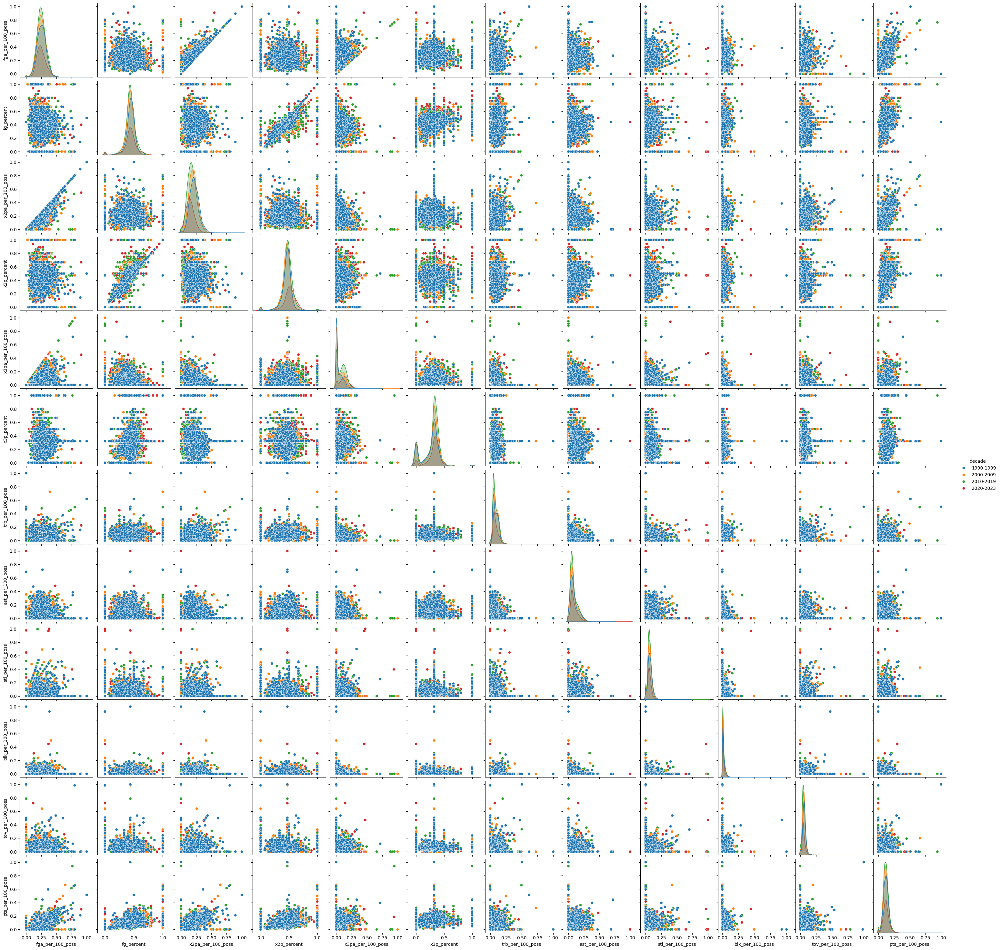

In [ ]:
#create a pairplot, with the hue being what decade the season is in
sns.pairplot(normalized.drop(columns=['player', 'season']), hue='decade')

<ipython-input-53-d05522c28484>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation_matrix = normalized.drop(columns=['decade']).corr()


<Axes: >

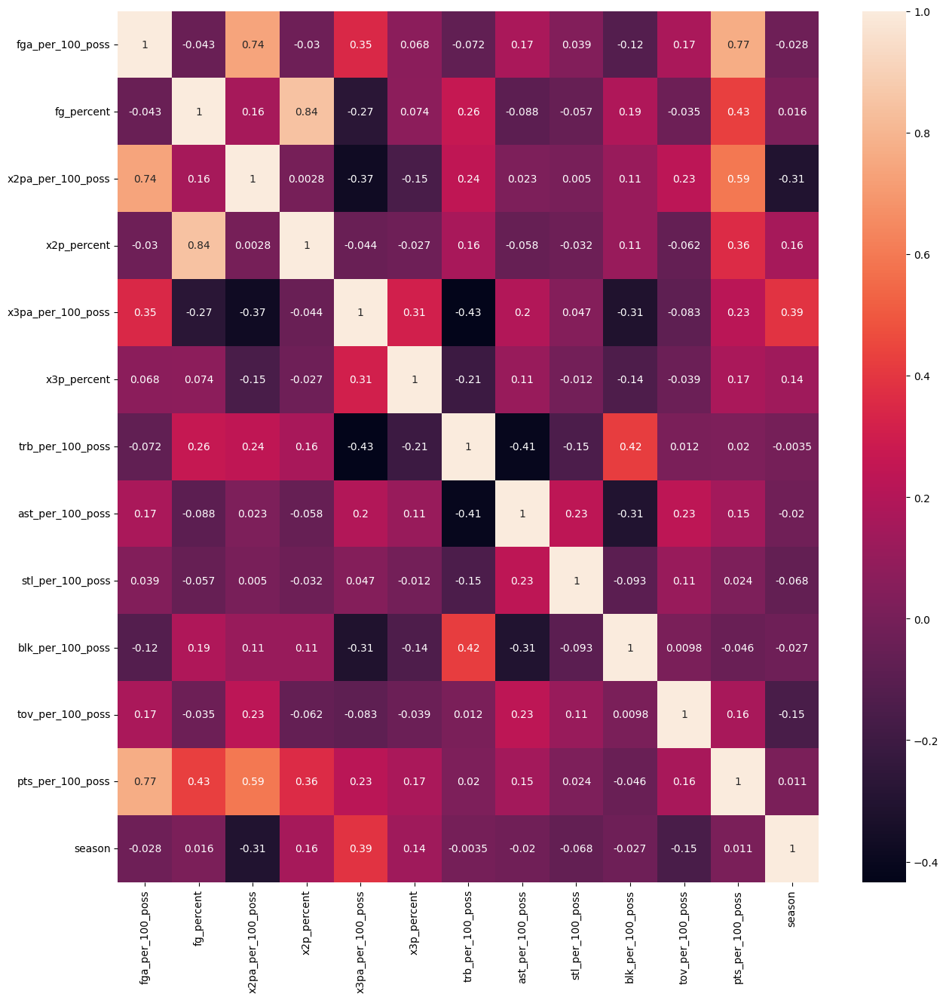

In [ ]:
# create a correlation coefficient matrix, from the range -1 to 1, where 1 is a perfect positive correlation, -1 is a perfect negative correlation, and 0 is no correlation
correlation_matrix = normalized.drop(columns=['decade']).corr()
correlation_matrix

#create a heatmap of the correlation matrix, spread out the values for better visualization
fig, ax = plt.subplots(figsize=(15,15))         # Sample figsize in inches

sns.heatmap(correlation_matrix, annot=True, ax=ax)

# Combined

In [ ]:
merged = pd.merge(normalized, df_sample_filtered[['player', 'season', 'decade', 'pts_per_game']], on=['player', 'season'])

In [ ]:
merged = merged.drop(columns='decade_y')
merged = merged.rename(columns={'decade_x': 'decade'})

In [ ]:
merged_sample = merged.sample(n=50)
merged_sample

,fga_per_100_poss,fg_percent,x2pa_per_100_poss,x2p_percent,x3pa_per_100_poss,x3p_percent,trb_per_100_poss,ast_per_100_poss,stl_per_100_poss,blk_per_100_poss,tov_per_100_poss,pts_per_100_poss,decade,player,season,pts_per_game
66,0.296183,0.465,0.141985,0.546,0.190926,0.391,0.041470,0.181633,0.064,0.011029,0.073171,0.161452,2020-2023,D'Angelo Russell,2023,17.8
773,0.326718,0.503,0.178626,0.610,0.183365,0.373,0.077286,0.134694,0.076,0.003676,0.073171,0.189612,2020-2023,Josh Hart,2022,14.9
5389,0.250382,0.415,0.122137,0.480,0.158790,0.353,0.061263,0.155102,0.060,0.011029,0.086304,0.117647,2010-2019,Hedo Türkoğlu,2012,10.9
4059,0.262595,0.431,0.169466,0.444,0.115312,0.406,0.125353,0.059184,0.072,0.012868,0.031895,0.123279,2010-2019,Jonas Jerebko,2015,5.2
10592,0.216794,0.426,0.215267,0.430,0.001890,0.000,0.098963,0.034694,0.068,0.020221,0.048780,0.094493,2000-2009,Cal Bowdler,2000,2.7
5568,0.259542,0.478,0.042748,0.509,0.268431,0.472,0.049953,0.012245,0.032,0.009191,0.020638,0.150814,2010-2019,Steve Novak,2012,8.8
2352,0.177099,0.485,0.123664,0.524,0.066163,0.395,0.057493,0.177551,0.072,0.005515,0.048780,0.096996,2010-2019,Tomáš Satoranský,2019,8.9
13530,0.187786,0.500,0.151145,0.625,0.047259,0.000,0.081056,0.277551,0.100,0.000000,0.046904,0.092616,1990-1999,Steve Kerr,1993,2.6
7371,0.254962,0.474,0.117557,0.575,0.170132,0.388,0.044298,0.067347,0.044,0.020221,0.043152,0.147059,2000-2009,Kyle Korver,2008,9.9
12723,0.290076,0.489,0.227481,0.514,0.077505,0.398,0.049010,0.102041,0.088,0.007353,0.039400,0.149562,1990-1999,Kevin Gamble,1995,7.4


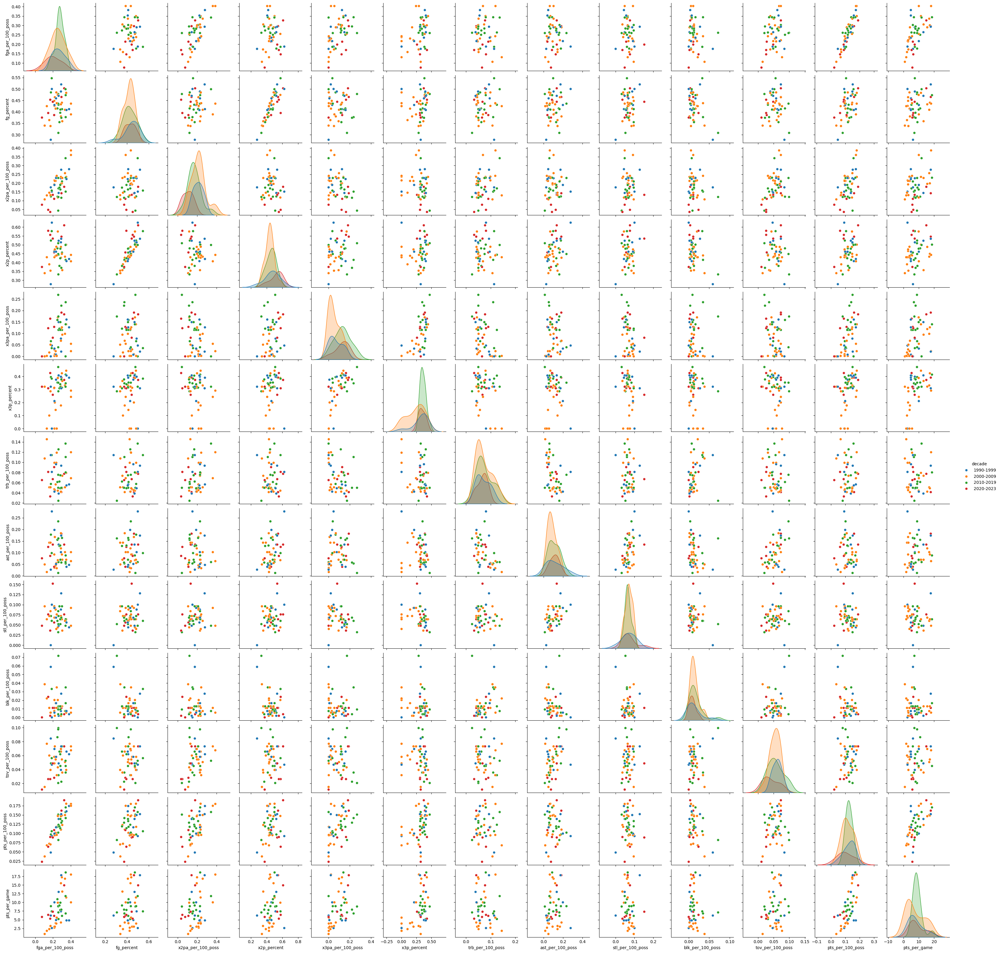

In [ ]:
sns.pairplot(merged_sample.drop(columns=['player', 'season']), hue='decade')

<Axes: >

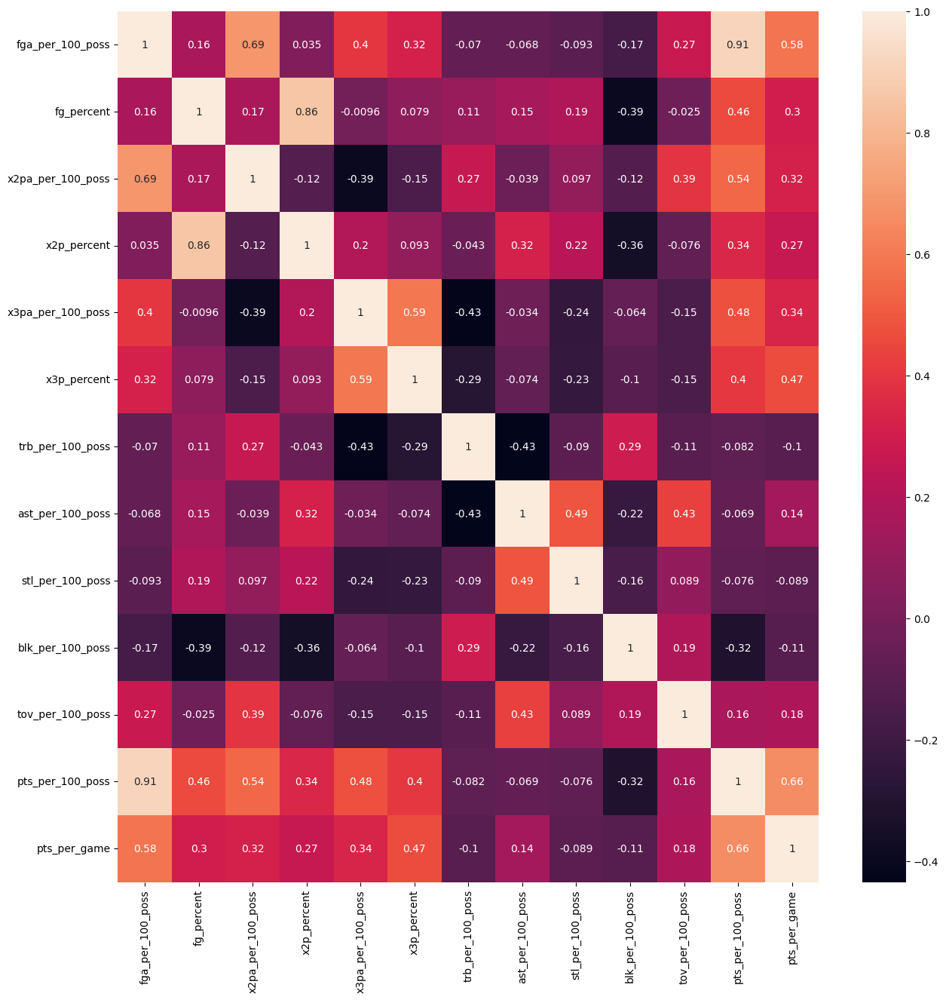

In [ ]:
# create a correlation coefficient matrix, from the range -1 to 1, where 1 is a perfect positive correlation, -1 is a perfect negative correlation, and 0 is no correlation
correlation_matrix_merge = merged_sample.drop(columns=['decade', 'player', 'season']).corr()
correlation_matrix_merge

#create a heatmap of the correlation matrix, spread out the values for better visualization
fig, ax = plt.subplots(figsize=(15,15))         # Sample figsize in inches

sns.heatmap(correlation_matrix_merge, annot=True, ax=ax)